# THE BATTLE OF NEIGHBORHOODS

### _Data Science Capstone Project: Analyzing Chicago Neighborhoods_
By Neelabh Sen

## Introduction

The background of the business problem that we will be addressing in this project is as follows- a Japanese immigrant family is moving to Chicago and setting up a business which imports authentic ingredients (such as Nori (Seaweed), Wasabi, Miso, Sushi Rice, Rice Vinegar etc.) and other food stuffs from Japan and sells them to local businesses such as eateries and restaurants. Thus, the problem is two-fold:
-	The business should be set-up in an area which is in close proximity to well-established Japanese restaurants.
-	The neighborhood should be well-suited to a young immigrant family, i.e., it should have all the necessary amenities in the vicinity. 
-	Furthermore, the neighborhood should also be as crime-free as possible, i.e., with a low crime rate.

## Data Required

-	Crime Data from the Chicago City Data Portal which maintains an extensive record of all crimes that have been reported in Chicago over the last two decades including- date, type of crime, exact location, district, police ward etc. 
-	Chicago city data which includes the names and boundaries of all neighborhoods was obtained from the Chicago Data Portal in ‘csv’ format as well as Geospatial data was obtained in ‘json’ format. 
-	Data about the venues and amenities within a 1km radius of each neighborhood and the locations of established Japanese restaurants in Chicago was obtained using the Foursquare API.

#### Methodology and Discussion: 
The code below has been annotated with explanations for each step. A more detailed section on the methodology and discussion of the results has been included within the report. 

In [1]:
# Importing all the necessary python libraries

import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!pip install geopy
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
%matplotlib inline

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library

print('Libraries imported.')

Libraries imported.


In [2]:
# Reading Chicago's Crime Data for 2016 from a csv file
chicago_crime = pd.read_csv('Chicago_Crimes_2016.csv')
chicago_crime.head()

,Case Number,Date,Primary Type,District,Ward_Number,Community Area,Year,Latitude,Longitude
0,HZ250496,05/03/16 23:40,BATTERY,10.0,24.0,29.0,2016,41.864073,-87.706819
1,HZ250409,05/03/16 21:40,BATTERY,3.0,20.0,42.0,2016,41.782922,-87.604363
2,HZ250503,05/03/16 23:31,PUBLIC PEACE VIOLATION,15.0,37.0,25.0,2016,41.894908,-87.758372
3,HZ250424,05/03/16 22:10,BATTERY,15.0,28.0,25.0,2016,41.885687,-87.749516
4,HZ250455,05/03/16 22:00,THEFT,15.0,28.0,25.0,2016,41.886297,-87.761751


In [3]:
# Creating a new Dataframe with the Police Ward Number and number of crimes
df_crime_count = chicago_crime['Ward_Number'].value_counts().to_frame()
df_crime_count.index.name = 'Ward'
df_crime_count.head()

,Ward_Number
Ward,
28.0,52415
42.0,45240
24.0,45172
2.0,39862
27.0,36655


In [4]:
# Renaming the second column as 'Count' and resetting the index
df_crime_count.rename(columns={'Ward_Number':'Count'}, inplace=True)
df_crime_count = df_crime_count.reset_index()
df_crime_count.head()

,Ward,Count
0,28.0,52415
1,42.0,45240
2,24.0,45172
3,2.0,39862
4,27.0,36655


In [5]:
# Converting the ward numbers into type string
df_crime_count['Ward'] = df_crime_count['Ward'].astype('int')
df_crime_count['Ward'] = df_crime_count['Ward'].astype('str')
df_crime_count.head()

,Ward,Count
0,28,52415
1,42,45240
2,24,45172
3,2,39862
4,27,36655


In [6]:
# Defining the boundaries of the wards in the map
district_geo = r'Boundaries-Wards.geojson'

# Creating a Choropleth Map showing the intensity of crime in different areas of Chicago
Chicago_Map = folium.Map(location=[41.8781, -87.6298], zoom_start=10)
Chicago_Map.choropleth(geo_data = district_geo, 
                data = df_crime_count,
                columns = ['Ward','Count'],
                key_on = 'feature.properties.ward',
                fill_color = 'YlOrRd', 
                fill_opacity = 0.6, 
                line_opacity = 0.2,
                legend_name = 'Number of incidents per police ward 2016')
Chicago_Map

As can be seen in the choropleth map above, the intensity of crime is especially high in the inner cities and near the south central regions of the city, which makes these areas unsuitable for setting up a business or settling down.

### Importing Chicago Neighborhood Data to start Clustering

In [7]:
!wget -q -O 'chicago_data.json' https://data.cityofchicago.org/api/views/unjd-c2ca/rows.json
print('Data downloaded!')

Data downloaded!


In [8]:
# Reading the data into a Pandas Dataframe
df = pd.read_csv("chicago_neighborhoods.csv")
df.head()

,PRI_NEIGH,the_geom,SEC_NEIGH,SHAPE_AREA,SHAPE_LEN
0,Grand Boulevard,MULTIPOLYGON (((-87.60670812560372 41.81681377...,BRONZEVILLE,4.849250e+07,28196.837157
1,Printers Row,MULTIPOLYGON (((-87.62760697485348 41.87437097...,PRINTERS ROW,2.162138e+06,6864.247156
2,United Center,MULTIPOLYGON (((-87.66706868914602 41.88885187...,UNITED CENTER,3.252051e+07,23101.363745
3,Sheffield & DePaul,MULTIPOLYGON (((-87.65833494805533 41.92166144...,SHEFFIELD & DEPAUL,1.048259e+07,13227.049745
4,Humboldt Park,MULTIPOLYGON (((-87.74059567509266 41.88782316...,HUMBOLDT PARK,1.250104e+08,46126.751351


In [9]:
# Defining Column Names for the new Dataframe
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# Instantiate a new Dataframe
neighborhoods = pd.DataFrame(columns=column_names)
num = len(df)

In [10]:
# Creating a function to geocode the neighborhoods
from geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut

def do_geocode(address):
    geolocator = Nominatim(user_agent = 'chicago_explorer')
    try:
        return geolocator.geocode(address)
    except GeocoderTimedOut:
        return do_geocode(address)

In [11]:
# Looping through the data and filling in the Dataframe one row at a time
for i in range(num):
    neighborhood_name = df['PRI_NEIGH'][i]
    borough = df['SEC_NEIGH'][i]
    
    if "," in borough:
        borough = borough.split(",")[0].strip(" ")
    
    address = '{}, Chicago, IL'.format(neighborhood_name)
    location = do_geocode(address)

    
    if location is not None:
        neighborhood_lat = location.latitude
        neighborhood_lon = location.longitude

        neighborhoods = neighborhoods.append({'Borough': borough,
                                              'Neighborhood': neighborhood_name,
                                              'Latitude': neighborhood_lat,
                                              'Longitude': neighborhood_lon}, ignore_index=True)

In [12]:
# Checking the resulting Dataframe
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,BRONZEVILLE,Grand Boulevard,41.813923,-87.617272
1,PRINTERS ROW,Printers Row,41.873787,-87.628900
2,UNITED CENTER,United Center,41.880683,-87.674185
3,HUMBOLDT PARK,Humboldt Park,41.905767,-87.704174
4,GARFIELD PARK,Garfield Park,41.882088,-87.715917


In [13]:
# Checking the number of burroughs and neighborhoods listed in this dataframe
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]))

The dataframe has 75 boroughs and 95 neighborhoods.


In [14]:
# Adding Neighborhood markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(Chicago_Map)

Chicago_Map

## _Clustering the neighborhoods according to nearby venues._

Our aim here is to find neighborhoods with all the necessary amenities nearby that are necessary for a young family. We can then superimpose these cluster onto the Choropleth map showing intensity of crime. This will allow us to select neighborhoods with the least amount of criminal activity and the best amenities for a young family. These can include parks, recreational centers, cafes etc. where socializing with others happens naturally and therefore a family of Japanese migrants can soon assimilate into the local population.

#### Defining Foursquare API Credentials

In [15]:
CLIENT_ID = '4W0W0WHMGIC31GMXQZWOWVXQQGTP5KCLWDBC33U5K0SDYKRY' 
CLIENT_SECRET = 'XXHAOM32AVNZDYWS1EHRWIGLOKVCCOI3XZZSLL1KBASRDIPX' 
VERSION = '20180605' #Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 4W0W0WHMGIC31GMXQZWOWVXQQGTP5KCLWDBC33U5K0SDYKRY
CLIENT_SECRET:XXHAOM32AVNZDYWS1EHRWIGLOKVCCOI3XZZSLL1KBASRDIPX


#### Creating a function to explore nearby locations for all neighborhoods in Chicago

In [16]:
LIMIT = 100
def getNearbyVenues(names, latitudes, longitudes, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [17]:
# Run the above function for Chicago Neighborhoods
chicago_venues = getNearbyVenues(names=neighborhoods['Neighborhood'],
                                   latitudes=neighborhoods['Latitude'],
                                   longitudes=neighborhoods['Longitude'],)

Grand Boulevard
Printers Row
United Center
Humboldt Park
Garfield Park
North Lawndale
Little Village
Armour Square
Avalon Park
Burnside
Hermosa
Avondale
Logan Square
Calumet Heights
East Side
West Pullman
Garfield Ridge
New City
Englewood
Grand Crossing
Ashburn
Mount Greenwood
Morgan Park
O'Hare
Jackson Park
Loop
Pullman
Riverdale
Hegewisch
Greektown
Douglas
Museum Campus
Edgewater
Lake View
Lincoln Park
Magnificent Mile
Lincoln Square
Oakland
Grant Park
West Loop
Fuller Park
Andersonville
Woodlawn
Portage Park
Kenwood
Rogers Park
Jefferson Park
Sauganash,Forest Glen
North Park
Albany Park
Irving Park
Dunning
West Ridge
Uptown
Norwood Park
Streeterville
South Shore
Chatham
South Chicago
Roseland
North Center
South Deering
Washington Park
Millenium Park
Near South Side
Chinatown
Chicago Lawn
Auburn Gresham
Beverly
Washington Heights
Edison Park
Hyde Park
Bucktown
Lower West Side
Wrigleyville
Archer Heights
Brighton Park
Mckinley Park
East Village
West Town
Bridgeport
West Elsdon
Gage Pa

In [18]:
# Checking the new Dataframe
print(chicago_venues.shape)
chicago_venues.head()

(5703, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Grand Boulevard,41.813923,-87.617272,Ain't She Sweet Cafe,41.816817,-87.613004,Coffee Shop
1,Grand Boulevard,41.813923,-87.617272,Chicago Blues District,41.810071,-87.614105,Jazz Club
2,Grand Boulevard,41.813923,-87.617272,Sip & Savor,41.816817,-87.612876,Coffee Shop
3,Grand Boulevard,41.813923,-87.617272,Parkway Ballroom,41.813142,-87.616064,Food
4,Grand Boulevard,41.813923,-87.617272,Blues Brothers Mural / Shelly's Loan & Jewelry...,41.809391,-87.619517,Plaza


#### _Checking the number of venues for each neighborhood (as radius was 1000, i.e. in a 1Km vicinity)_

In [19]:
chicago_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Albany Park,75,75,75,75,75,75
Andersonville,100,100,100,100,100,100
Archer Heights,38,38,38,38,38,38
Armour Square,55,55,55,55,55,55
Ashburn,20,20,20,20,20,20
Auburn Gresham,32,32,32,32,32,32
Austin,13,13,13,13,13,13
Avalon Park,27,27,27,27,27,27
Avondale,100,100,100,100,100,100


#### _Finding the number of unique categories_

In [20]:
print('There are {} uniques categories.'.format(len(chicago_venues['Venue Category'].unique())))

There are 372 uniques categories.


#### _Analyzing each neighborhood_

In [21]:
# one hot encoding
chicago_onehot = pd.get_dummies(chicago_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
chicago_onehot['Neighborhood'] = chicago_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [chicago_onehot.columns[-1]] + list(chicago_onehot.columns[:-1])
chicago_onehot = chicago_onehot[fixed_columns]

# shape of this dataframe
print(chicago_onehot.shape)

chicago_onehot.head()

(5703, 372)


,Zoo,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Workshop,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Caribbean Restaurant,Casino,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Cafeteria,College Gym,College Quad,College Rec Center,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Creperie,Cruise,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Lawyer,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Neighborhood,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Outlet Store,Pakistani Restaurant,Paper / Office Supplies Store,Park,Parking,Pastry Shop,Pawn Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pier,Pizza Place,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Pop-Up Shop,Portuguese Restaurant,Post Office,Pub,Public Art,Ramen Restaurant,Real Estate Office,Record S

#### _Group rows by neighborhood and by taking the mean of the frequency of occurrence of each category_

In [22]:
chicago_grouped = chicago_onehot.groupby('Neighborhood').mean().reset_index()

# Size of this dataframe
print(chicago_grouped.shape)

chicago_grouped.head()

(95, 372)


,Neighborhood,Zoo,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Workshop,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Caribbean Restaurant,Casino,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Cafeteria,College Gym,College Quad,College Rec Center,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Creperie,Cruise,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Lawyer,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Outlet Store,Pakistani Restaurant,Paper / Office Supplies Store,Park,Parking,Pastry Shop,Pawn Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pier,Pizza Place,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Pop-Up Shop,Portuguese Restaurant,Post Office,Pub,Public Art,Ramen Restaurant,Real Estate Office,Record S

#### _Printing each neighborhood along with the Top 5 most common venues_

In [23]:
num_top_venues = 5

for hood in chicago_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = chicago_grouped[chicago_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Albany Park----
                       venue  freq
0  Middle Eastern Restaurant  0.05
1             Ice Cream Shop  0.04
2             Sandwich Place  0.04
3                     Bakery  0.04
4                Pizza Place  0.04


----Andersonville----
                  venue  freq
0        Breakfast Spot  0.04
1         Grocery Store  0.04
2           Coffee Shop  0.04
3  Gym / Fitness Center  0.03
4       Thai Restaurant  0.03


----Archer Heights----
                  venue  freq
0    Mexican Restaurant  0.11
1     Mobile Phone Shop  0.08
2                   Bar  0.05
3         Grocery Store  0.05
4  Fast Food Restaurant  0.05


----Armour Square----
                venue  freq
0  Chinese Restaurant  0.18
1         Pizza Place  0.07
2                Park  0.05
3                 Bar  0.05
4              Bakery  0.04


----Ashburn----
                    venue  freq
0    Fast Food Restaurant  0.10
1      Seafood Restaurant  0.10
2                    Park  0.10
3     Fried Chicken Joi

#### _Creating a function to sort the venues in descending order_

In [24]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

#### _Creating the new dataframe that displays the top 10 venues for each neighborhood_

In [25]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = chicago_grouped['Neighborhood']

for ind in np.arange(chicago_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(chicago_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Albany Park,Middle Eastern Restaurant,Ice Cream Shop,Bakery,Park,Mexican Restaurant,Sandwich Place,Asian Restaurant,Pizza Place,Grocery Store,Burger Joint
1,Andersonville,Grocery Store,Coffee Shop,Breakfast Spot,Pizza Place,Vietnamese Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Bakery,Thai Restaurant,Asian Restaurant
2,Archer Heights,Mexican Restaurant,Mobile Phone Shop,Bar,Clothing Store,Fast Food Restaurant,Grocery Store,Eastern European Restaurant,Taco Place,Big Box Store,Shoe Store
3,Armour Square,Chinese Restaurant,Pizza Place,Park,Bar,American Restaurant,Business Service,Bakery,Mexican Restaurant,Italian Restaurant,Asian Restaurant
4,Ashburn,Seafood Restaurant,Fast Food Restaurant,Park,Fried Chicken Joint,Hot Dog Joint,Clothing Store,Donut Shop,Discount Store,Sandwich Place,Furniture / Home Store


#### Now we can start Clustering the Neighborhoods

#### _Running the k-means algorithm to cluster the neighborhoods into 5 clusters_

In [26]:
# set number of clusters
kclusters = 5

chicago_grouped_clustering = chicago_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(chicago_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 0, 1, 0, 2, 2, 2, 2, 0, 1], dtype=int32)

#### _Creating a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood_

In [27]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

chicago_merged = neighborhoods

# merge chicago_grouped with chicago_data to add latitude/longitude for each neighborhood
chicago_merged = chicago_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

chicago_merged.head()

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,BRONZEVILLE,Grand Boulevard,41.813923,-87.617272,2,BBQ Joint,Bus Station,Art Gallery,Coffee Shop,Deli / Bodega,Discount Store,Fried Chicken Joint,Seafood Restaurant,Breakfast Spot,Train Station
1,PRINTERS ROW,Printers Row,41.873787,-87.628900,0,Coffee Shop,Hotel,Gym / Fitness Center,Pizza Place,Taco Place,Theater,Yoga Studio,American Restaurant,Portuguese Restaurant,Arts & Crafts Store
2,UNITED CENTER,United Center,41.880683,-87.674185,0,Outdoor Sculpture,Art Gallery,Sandwich Place,Brewery,Stadium,Donut Shop,Fast Food Restaurant,Bar,Mexican Restaurant,Gastropub
3,HUMBOLDT PARK,Humboldt Park,41.905767,-87.704174,0,Bar,Latin American Restaurant,Fast Food Restaurant,Discount Store,Deli / Bodega,Liquor Store,Playground,Coffee Shop,Pizza Place,Park
4,GARFIELD PARK,Garfield Park,41.882088,-87.715917,2,Botanical Garden,Fast Food Restaurant,Train Station,Sandwich Place,Pharmacy,Food,Baseball Field,Sports Bar,Discount Store,Diner


#### _Visualizing the Resulting Clusters on a Map_

In [28]:
# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(chicago_merged['Latitude'], chicago_merged['Longitude'], chicago_merged['Neighborhood'], chicago_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(Chicago_Map)

Chicago_Map

#### _Examining the Clusters_

#### Cluster 0- Red (Largest Cluster). Most Common Venues- Coffee Shops, Bars, Parks, Bookstores and Restaurants

In [29]:
chicago_merged.loc[chicago_merged['Cluster Labels'] == 0, chicago_merged.columns[[1] + list(range(5, chicago_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Printers Row,Coffee Shop,Hotel,Gym / Fitness Center,Pizza Place,Taco Place,Theater,Yoga Studio,American Restaurant,Portuguese Restaurant,Arts & Crafts Store
2,United Center,Outdoor Sculpture,Art Gallery,Sandwich Place,Brewery,Stadium,Donut Shop,Fast Food Restaurant,Bar,Mexican Restaurant,Gastropub
3,Humboldt Park,Bar,Latin American Restaurant,Fast Food Restaurant,Discount Store,Deli / Bodega,Liquor Store,Playground,Coffee Shop,Pizza Place,Park
6,Little Village,Hotel,American Restaurant,Park,Coffee Shop,Pizza Place,Music Venue,Museum,Taco Place,Theater,Ice Cream Shop
7,Armour Square,Chinese Restaurant,Pizza Place,Park,Bar,American Restaurant,Business Service,Bakery,Mexican Restaurant,Italian Restaurant,Asian Restaurant
11,Avondale,Bar,Mexican Restaurant,Donut Shop,Grocery Store,Chinese Restaurant,Italian Restaurant,Park,Pizza Place,Theater,Art Gallery
12,Logan Square,Café,Coffee Shop,Park,Mexican Restaurant,Brewery,Cocktail Bar,Playground,Bakery,New American Restaurant,Ice Cream Shop
23,O'Hare,Coffee Shop,Airport Lounge,Snack Place,Airport Service,Bar,Accessories Store,Electronics Store,Tea Room,American Restaurant,Bookstore
25,Loop,Hotel,American Restaurant,Park,Coffee Shop,Pizza Place,Music Venue,Museum,Taco Place,Theater,Ice Cream Shop
28,Hegewisch,Bar,Pizza Place,Intersection,Greek Restaurant,Park,Deli / Bodega,Mexican Restaurant,Chinese Restaurant,American Restaurant,Pet Store


#### Cluster 1- Purple. Most Common Venues- Mexican Restaurants and Pizza Places

In [30]:
chicago_merged.loc[chicago_merged['Cluster Labels'] == 1, chicago_merged.columns[[1] + list(range(5, chicago_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
10,Hermosa,Mexican Restaurant,Latin American Restaurant,Grocery Store,Pharmacy,Diner,Bakery,Mobile Phone Shop,Discount Store,Liquor Store,Park
14,East Side,Mexican Restaurant,Pizza Place,Bar,Rental Car Location,Convenience Store,Supermarket,Harbor / Marina,Pharmacy,Salon / Barbershop,Casino
16,Garfield Ridge,Mexican Restaurant,Park,Sports Bar,Hot Dog Joint,Restaurant,Discount Store,Fast Food Restaurant,Nightclub,Liquor Store,Marijuana Dispensary
17,New City,Bank,Discount Store,Pharmacy,American Restaurant,Grocery Store,Mexican Restaurant,Chinese Restaurant,Check Cashing Service,Gas Station,Optical Shop
21,Mount Greenwood,Pizza Place,Dive Bar,Bar,Mexican Restaurant,Fast Food Restaurant,Ice Cream Shop,Breakfast Spot,Dry Cleaner,Donut Shop,Discount Store
24,Jackson Park,Bakery,Bank,Liquor Store,Mexican Restaurant,Thrift / Vintage Store,Light Rail Station,Fried Chicken Joint,Supermarket,Food Truck,Ice Cream Shop
45,Rogers Park,Mexican Restaurant,Sandwich Place,Bar,Park,Pizza Place,Bakery,American Restaurant,Beach,Café,Sushi Restaurant
51,Dunning,Cosmetics Shop,Shoe Store,Fast Food Restaurant,Bar,Automotive Shop,Park,Pet Store,Pizza Place,Donut Shop,Sandwich Place
58,South Chicago,Mexican Restaurant,Discount Store,Train Station,Pharmacy,Sandwich Place,Supermarket,Dive Bar,Fish Market,Grocery Store,Gym
73,Lower West Side,Mexican Restaurant,Grocery Store,Park,Food,Bakery,Italian Restaurant,Pizza Place,Bar,Supermarket,Sports Club


#### Cluster 2- Blue. Most Common Venues- Fast food restaurants and Parks

In [31]:
chicago_merged.loc[chicago_merged['Cluster Labels'] == 2, chicago_merged.columns[[1] + list(range(5, chicago_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Grand Boulevard,BBQ Joint,Bus Station,Art Gallery,Coffee Shop,Deli / Bodega,Discount Store,Fried Chicken Joint,Seafood Restaurant,Breakfast Spot,Train Station
4,Garfield Park,Botanical Garden,Fast Food Restaurant,Train Station,Sandwich Place,Pharmacy,Food,Baseball Field,Sports Bar,Discount Store,Diner
5,North Lawndale,Food,Pizza Place,Fast Food Restaurant,Bus Station,Hot Dog Joint,Gym / Fitness Center,Soccer Field,Metro Station,Martial Arts Dojo,Liquor Store
8,Avalon Park,Fast Food Restaurant,Park,Pharmacy,Sandwich Place,Grocery Store,Dance Studio,Seafood Restaurant,Cajun / Creole Restaurant,Athletics & Sports,Diner
9,Burnside,Fast Food Restaurant,Dry Cleaner,Rental Car Location,Ice Cream Shop,Grocery Store,Liquor Store,Lounge,Caribbean Restaurant,Southern / Soul Food Restaurant,Seafood Restaurant
13,Calumet Heights,Pharmacy,Fast Food Restaurant,Discount Store,Fried Chicken Joint,Wings Joint,Pizza Place,Sandwich Place,Bus Station,Rental Car Location,Burger Joint
15,West Pullman,Fast Food Restaurant,Discount Store,Basketball Court,Park,Grocery Store,Burger Joint,Clothing Store,Video Game Store,American Restaurant,Train Station
18,Englewood,Fast Food Restaurant,Park,Intersection,Seafood Restaurant,Sandwich Place,Discount Store,Nightclub,Restaurant,Chinese Restaurant,Supermarket
19,Grand Crossing,Lounge,Spa,Fried Chicken Joint,African Restaurant,Train Station,Food,Pizza Place,Food & Drink Shop,Fast Food Restaurant,Southern / Soul Food Restaurant
20,Ashburn,Seafood Restaurant,Fast Food Restaurant,Park,Fried Chicken Joint,Hot Dog Joint,Clothing Store,Donut Shop,Discount Store,Sandwich Place,Furniture / Home Store


#### Cluster 3- Green. Most common venues- Golf courses and Bike trails

In [32]:
chicago_merged.loc[chicago_merged['Cluster Labels'] == 3, chicago_merged.columns[[1] + list(range(5, chicago_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
61,South Deering,Golf Course,Bike Trail,Waste Facility,Falafel Restaurant,Drugstore,Dry Cleaner,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant


#### Cluster 4- Orange Parks and Grocery Stores

In [33]:
chicago_merged.loc[chicago_merged['Cluster Labels'] == 4, chicago_merged.columns[[1] + list(range(5, chicago_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
27,Riverdale,Park,Grocery Store,Yoga Studio,Dog Run,Drugstore,Dry Cleaner,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant


Analysis: Clusters 0 and 1 (Red and Purple) are among the biggest clusters with a large number of Coffee Shops, Restaurants and Parks, which indicate a high standard of living with plenty of food choices, recreational areas and ample open spaces. These kinds of areas are perfect for families with young children. Clusters 3 and 4 (Green and Orange) are comparitively much smallers with just 1 neighborhood each.

## _Now lets go deeper and find information about neighborhoods in Chicago with the most popular Japanese Restaurants_

In [34]:
# Defining a function to get nearby venue details for a neighborhoods and returning a dataframe
def get_venues(lat,lng):
    
    #url to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
    
    # get all the data
    results = requests.get(url).json()
    venue_data=results["response"]['groups'][0]['items']
    venue_details=[]
    for row in venue_data:
        try:
            venue_id=row['venue']['id']
            venue_name=row['venue']['name']
            venue_category=row['venue']['categories'][0]['name']
            venue_details.append([venue_id,venue_name,venue_category])
        except KeyError:
            pass
        
    column_names=['ID','Name','Category']
    df = pd.DataFrame(venue_details,columns=column_names)
    return df

In [38]:
# Preparing a list of neighborhood list that contains Japanese resturants
radius=1000 # 1Km in the vicinity
LIMIT=100
column_names=['Borough', 'Neighborhood', 'ID','Name']
japanese_rest_chicago=pd.DataFrame(columns=column_names)
count=1
for row in neighborhoods.values.tolist():
    Borough, Neighborhood, Latitude, Longitude=row
    venues = get_venues(Latitude,Longitude)
    japanese_resturants=venues[venues['Category']=='Japanese Restaurant']   
    print('(',count,'/',len(neighborhoods),')','Japanese Resturants in '+Neighborhood+', '+Borough+':'+str(len(japanese_resturants)))
    for resturant_detail in japanese_resturants.values.tolist():
        id, name , category=resturant_detail
        japanese_rest_chicago = japanese_rest_chicago.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name
                                               }, ignore_index=True)
    count+=1

( 1 / 95 ) Japanese Resturants in Grand Boulevard, BRONZEVILLE:0
( 2 / 95 ) Japanese Resturants in Printers Row, PRINTERS ROW:1
( 3 / 95 ) Japanese Resturants in United Center, UNITED CENTER:0
( 4 / 95 ) Japanese Resturants in Humboldt Park, HUMBOLDT PARK:0
( 5 / 95 ) Japanese Resturants in Garfield Park, GARFIELD PARK:0
( 6 / 95 ) Japanese Resturants in North Lawndale, NORTH LAWNDALE:0
( 7 / 95 ) Japanese Resturants in Little Village, LITTLE VILLAGE:1
( 8 / 95 ) Japanese Resturants in Armour Square, ARMOUR SQUARE:0
( 9 / 95 ) Japanese Resturants in Avalon Park, AVALON PARK:0
( 10 / 95 ) Japanese Resturants in Burnside, CHATHAM:0
( 11 / 95 ) Japanese Resturants in Hermosa, BELMONT CRAIGIN:0
( 12 / 95 ) Japanese Resturants in Avondale, IRVING PARK:1
( 13 / 95 ) Japanese Resturants in Logan Square, LOGAN SQUARE:0
( 14 / 95 ) Japanese Resturants in Calumet Heights, AVALON PARK:0
( 15 / 95 ) Japanese Resturants in East Side, SOUTHEAST SIDE:0
( 16 / 95 ) Japanese Resturants in West Pullman,

In [39]:
# Checking the Dataframe
print(japanese_rest_chicago.shape)
japanese_rest_chicago

(30, 4)


,Borough,Neighborhood,ID,Name
0,PRINTERS ROW,Printers Row,51018fa2e4b0ca484f8ac272,UMAI Japanese Kitchen & Sushi
1,LITTLE VILLAGE,Little Village,51018fa2e4b0ca484f8ac272,UMAI Japanese Kitchen & Sushi
2,IRVING PARK,Avondale,57e584e7498e0eda481b3d60,Ryuu Asian BBQ
3,LOOP,Loop,51018fa2e4b0ca484f8ac272,UMAI Japanese Kitchen & Sushi
4,GREEKTOWN,Greektown,54296aa7498e36575ee9a8b6,Momotaro
5,MUSEUM CAMPUS,Museum Campus,51343046e4b08f70ffe26b8f,SumoSam
6,MUSEUM CAMPUS,Museum Campus,4efd2d1a9adffb90ca7a8fdb,Tokyo Tokyo
7,MUSEUM CAMPUS,Museum Campus,5be575095c68380039ad6a91,Pepper Lunch
8,LAKE VIEW,Lake View,4b78c82af964a52024e22ee3,Yoshi's Cafe
9,LAKE VIEW,Lake View,4c5851eab7a31b8d243d52da,Ukai Japanese Restaurant


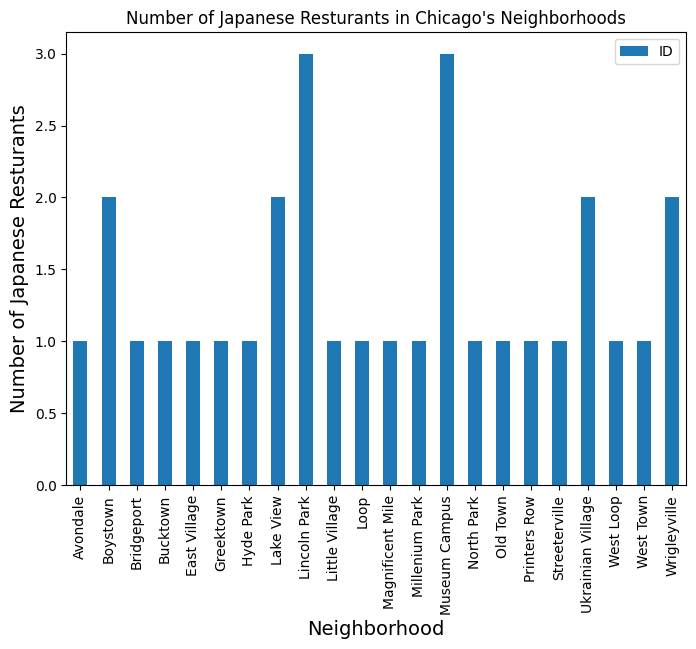

In [40]:
# PLotting number of restaurants
plt.figure(figsize=(8,6), dpi = 100)
plt.title("Number of Japanese Resturants in Chicago's Neighborhoods" )
plt.xlabel('Neighborhood', fontsize = 14)
plt.ylabel('Number of Japanese Resturants', fontsize=14)
japanese_rest_chicago.groupby('Neighborhood')['ID'].count().plot(kind='bar')
plt.legend()
plt.show()

As can be seen in the above graph, neighborhoods like _Museum Campus, Lincoln Park, Lakeview, Ukrainian Village, Wrigleyville and Boystown_ have the highest number of established Japanese Restaurants in the city of Chicago. In addition to these, some other neighborhoods also have a well-established Japanese restaurant. This indicates that Japanese food is seen as a delicacy which is enjoyed on special occasions and not as regularly as fast-food variants such as hamburgers and pizzas.

#### _Getting additional information about these restaurants like tips and ratings_

In [41]:
# Creating a function to obtain venue details
def get_venue_details(venue_id):
    
    url = 'https://api.foursquare.com/v2/venues/{}?&client_id={}&client_secret={}&v={}'.format(
            venue_id,
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION)
    
    # get all the data
    results = requests.get(url).json()
    venue_data=results['response']['venue']
    venue_details=[]
    try:
        venue_id=venue_data['id']
        venue_name=venue_data['name']
        venue_likes=venue_data['likes']['count']
        venue_rating=venue_data['rating']
        venue_tips=venue_data['tips']['count']
        venue_details.append([venue_id,venue_name,venue_likes,venue_rating,venue_tips])
    except KeyError:
        pass
        
    column_names=['ID','Name','Likes','Rating','Tips']
    df = pd.DataFrame(venue_details,columns=column_names)
    return df

In [42]:
# Preparing neighborhood list that have Japanese resturants and Details
column_names=['Borough', 'Neighborhood', 'ID','Name','Likes','Rating','Tips']
japanese_rest_stats_chicago=pd.DataFrame(columns=column_names)
count=1


for row in japanese_rest_chicago.values.tolist():
    Borough,Neighborhood,ID,Name=row
    try:
        venue_details=get_venue_details(ID)
        print(venue_details)
        id,name,likes,rating,tips=venue_details.values.tolist()[0]
    except IndexError:
        print('No data available for id=',ID)
        id,name,likes,rating,tips=[0]*5
    print('(',count,'/',len(japanese_rest_chicago),')','processed')
    japanese_rest_stats_chicago = japanese_rest_stats_chicago.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name,
                                                'Likes' : likes,
                                                'Rating' : rating,
                                                'Tips' : tips
                                               }, ignore_index=True)
    count+=1

                         ID                           Name  Likes  Rating  \
0  51018fa2e4b0ca484f8ac272  UMAI Japanese Kitchen & Sushi    176     8.6   

   Tips  
0    42  
( 1 / 30 ) processed
                         ID                           Name  Likes  Rating  \
0  51018fa2e4b0ca484f8ac272  UMAI Japanese Kitchen & Sushi    176     8.6   

   Tips  
0    42  
( 2 / 30 ) processed
                         ID            Name  Likes  Rating  Tips
0  57e584e7498e0eda481b3d60  Ryuu Asian BBQ     16     7.8     5
( 3 / 30 ) processed
                         ID                           Name  Likes  Rating  \
0  51018fa2e4b0ca484f8ac272  UMAI Japanese Kitchen & Sushi    176     8.6   

   Tips  
0    42  
( 4 / 30 ) processed
                         ID      Name  Likes  Rating  Tips
0  54296aa7498e36575ee9a8b6  Momotaro    339     8.7    91
( 5 / 30 ) processed
                         ID     Name  Likes  Rating  Tips
0  51343046e4b08f70ffe26b8f  SumoSam     13     7.8     9
( 6 / 

In [46]:
# Checking the resulting Dataframe
print(japanese_rest_stats_chicago.shape)
japanese_rest_stats_chicago.head()

(30, 7)


,Borough,Neighborhood,ID,Name,Likes,Rating,Tips
0,PRINTERS ROW,Printers Row,51018fa2e4b0ca484f8ac272,UMAI Japanese Kitchen & Sushi,176,8.6,42
1,LITTLE VILLAGE,Little Village,51018fa2e4b0ca484f8ac272,UMAI Japanese Kitchen & Sushi,176,8.6,42
2,IRVING PARK,Avondale,57e584e7498e0eda481b3d60,Ryuu Asian BBQ,16,7.8,5
3,LOOP,Loop,51018fa2e4b0ca484f8ac272,UMAI Japanese Kitchen & Sushi,176,8.6,42
4,GREEKTOWN,Greektown,54296aa7498e36575ee9a8b6,Momotaro,339,8.7,91


In [47]:
# Saving this data to a csv file
japanese_rest_stats_chicago.to_csv('Japanese Restaurants in Chicago Stats')

In [48]:
# Ranking the neighborhoods by their average ranking
ranked_neighborhood_stats=japanese_rest_stats_chicago.groupby('Neighborhood',as_index=False).mean()[['Neighborhood','Rating']]
ranked_neighborhood_stats.columns=['Neighborhood','Average Rating']
ranked_neighborhood_stats.sort_values(['Average Rating'],ascending=False)

,Neighborhood,Average Rating
20,West Town,9.000000
11,Magnificent Mile,8.900000
17,Streeterville,8.900000
12,Millenium Park,8.900000
5,Greektown,8.700000
19,West Loop,8.600000
4,East Village,8.600000
16,Printers Row,8.600000
9,Little Village,8.600000
10,Loop,8.600000


## Discussion and Conclusion

_West Town_, _Magnificent Mile_ and _Streeterville_ fare the best in terms of customer ratings, but these neighborhoods have just one established Japanese restaurant.
Although _Museum Campus_ has 3 Japanese Restaurants, the average rating indicates that the quality of food and customer satisfaction is not upto the mark.

On the other hand, _Lincoln Park_ which also has 3 Japanese restaurants has a decent average rating of 8.0.
_Boystown_, _Lakeview_, _Wrigleyville_ and _Ukrainian Village_ which all have 2 well-established Japanese restaurants receive really good average ratings around 8.4 and recommendations from customers. _ Therefore, these neighborhoods as well as _Lincoln Park_ are well suited for establishing a Japanese cuisine ingredients suppliers business.

After superimposing these results with our previous clustering and crime intensity map (see map), it can be seen that out of these shortlisted neighborhoods, _Ukrainian Village_ can be rejected as it lies in an area where the crime intensity is very high (see image below). 

The best option for setting up the business is around the _Lincoln Park_ neighborhood (see image below), as the crime intensity is low and it lies in cluster 0 with numerous recreational venues like cafes, parks, bookshops as well as **3 Japanese restaurants** situated in the vicinity. This makes it an ideal location for setting up a Japanese ingredients business as well as settling with a young family. The other nearby options include _Boystown, Wrigleyville and Lake View_ which are neighborhoods situated in close proximity to the Lincoln Park area. 

<img src="https://i.imgur.com/EVkqOVM.png">

This image shows the Lincoln Park Neighborhood and surrounding area.

<img src="https://i.imgur.com/s0fpUIP.png">

This image shows the high crime intensity neighborhoods of Chicago and the Ukrainian Village neighborhood in close proximity.

### _Thanks for Reading!_